In [1]:
import scanpy as sc
import scFates as scf
sc.set_figure_params()
scf.set_figure_pubready()

In [2]:
adata=sc.read("adata_CR_scFates.h5ad")

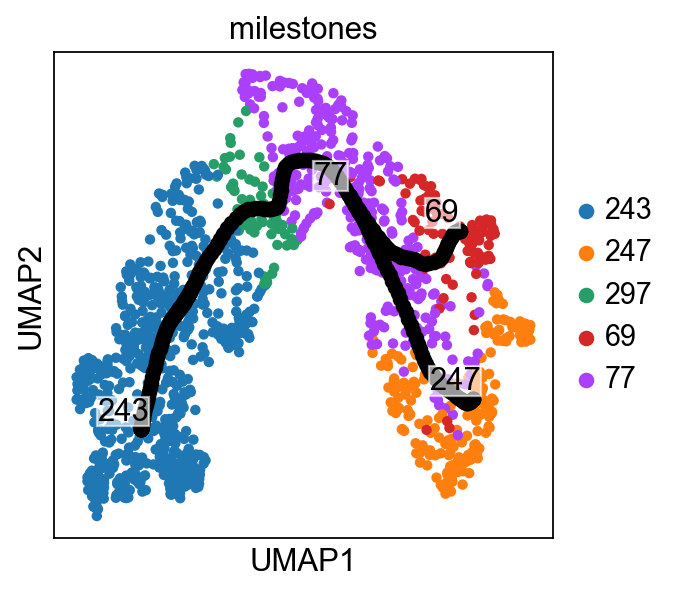

In [3]:
scf.pl.graph(adata,color_cells="milestones")

In [4]:
tmax=adata.obs.t[adata.obs.seg=="3"].max()

In [5]:
adata_sub=scf.tl.subset_tree(adata,t_max=tmax,copy=True)

subsetting tree
node 72 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph


/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (1361×1361).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (1361×1361).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
    finished (0:00:00) --> tree subsetted


In [6]:
adata.obs["sel"]=adata.obs_names.isin(adata_sub.obs_names).astype(str)

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'sel' as categorical


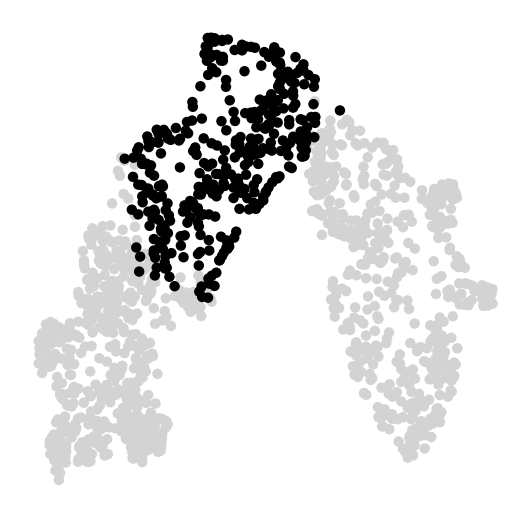

In [7]:
sc.pl.umap(adata,color="sel",groups=["True"],palette=["k"],
           frameon=False,title="",legend_loc="none")

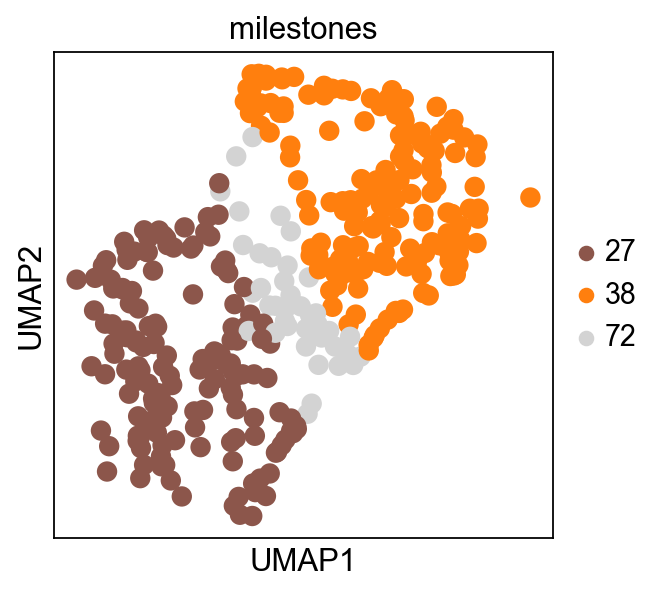

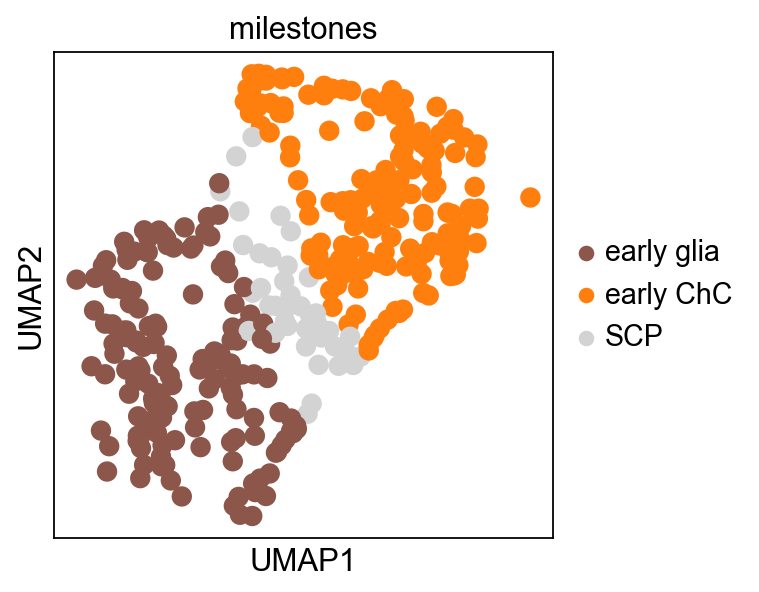

In [8]:
sc.pl.umap(adata_sub,color="milestones",palette=["tab:brown","tab:orange","lightgrey"])
scf.tl.rename_milestones(adata_sub,["early glia","early ChC","SCP"])
sc.pl.umap(adata_sub,color="milestones")

In [9]:
adata_ChC=scf.tl.subset_tree(adata_sub,root_milestone="SCP",milestones=["early ChC"],copy=True)

subsetting tree


/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (357×357).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (357×357).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


node 46 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
    finished (0:00:00) --> tree extracted
--> added 
    .obs['old_milestones'], previous milestones from intial tree


In [10]:
scf.tl.test_association(adata_ChC,n_jobs=40)
scf.tl.fit(adata_ChC,n_jobs=10)


/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (192×192).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (192×192).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


test features for association with the trajectory
    single mapping : 100%|██████████| 35535/35535 [00:42<00:00, 829.06it/s]
    found 82 significant features (0:00:42) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.
fit features associated with the trajectory
    single mapping :   0%|          | 0/82 [00:00<?, ?it/s]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (192×192).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (192×192).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


    single mapping : 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:17) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


In [11]:
scf.tl.cluster(adata_ChC,metric="correlation",device='gpu',knn=20)

    clustering using grapheno
Finding 20 nearest neighbors using correlation metric and brute algorithm...
Neighbors computed in 3.6829073429107666 seconds...
Computing Jaccard similarity...
jaccard graph constructed in 0.12036657333374023 seconds...
Running Louvain modularity optimization...
grapheno completed in 4.141675710678101 seconds...
Communities detected: 3
Modularity: 0.4943801164627075
    finished (0:00:06) --> added
    .obsp['similarity'], pairwise similarity graph.
    .var['fit_clusters'], cluster assignments for features.
    .uns['fit_clusters'], parameters and modularity of the clustering.


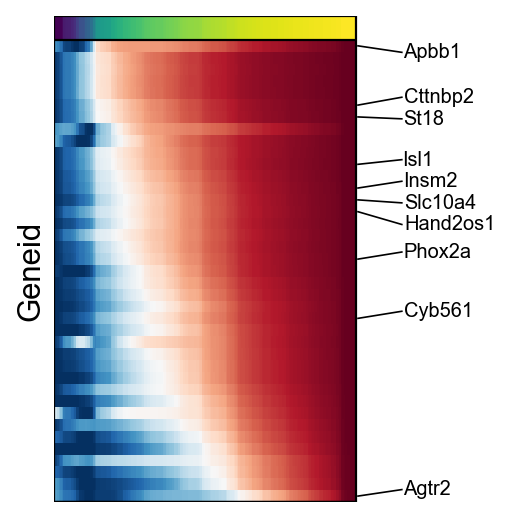

In [12]:
genes_ChC=scf.pl.trends(adata_ChC,cluster=0,plot_emb=False,ordering="max",return_genes=True)

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (192×192).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (192×192).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


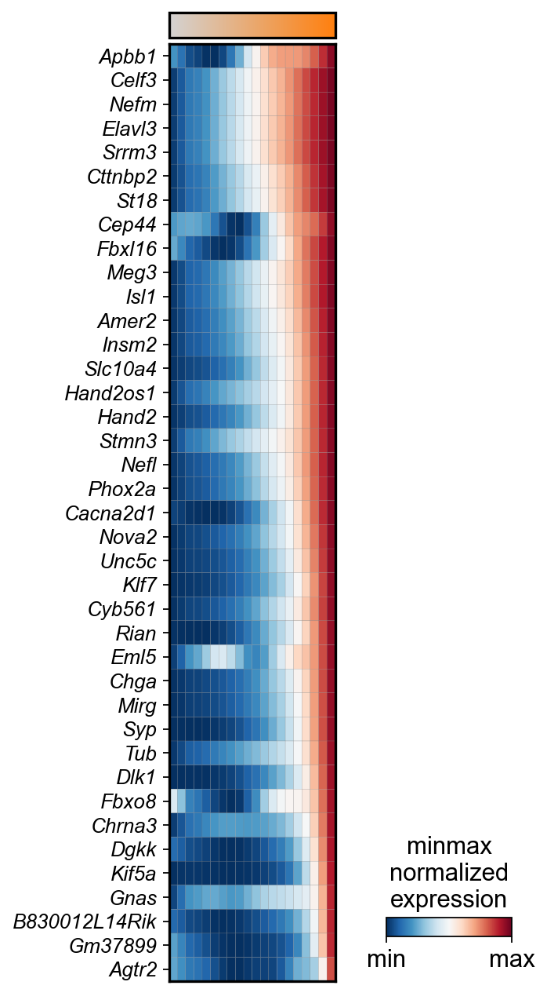

In [13]:
scf.pl.matrix(adata_ChC,genes_ChC,nbins=20,cmap="RdBu_r",norm="minmax",feature_style="italic",save="early_ChC_withcolorbar.pdf")

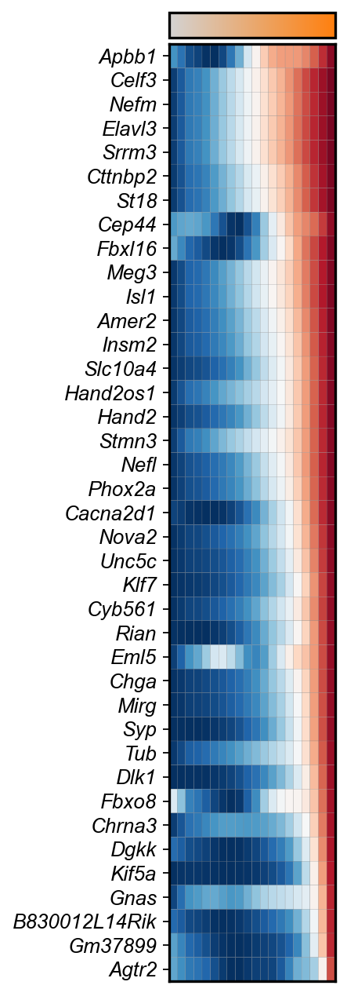

In [14]:
scf.pl.matrix(adata_ChC,genes_ChC,nbins=20,cmap="RdBu_r",norm="minmax",feature_style="italic",
              save="early_ChC.pdf",colorbar=False)

In [15]:
adata_glia=scf.tl.subset_tree(adata_sub,root_milestone="SCP",milestones=["early glia"],copy=True)

subsetting tree


/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (357×357).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (357×357).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


node 26 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
    finished (0:00:00) --> tree extracted
--> added 
    .obs['old_milestones'], previous milestones from intial tree


In [16]:
scf.tl.test_association(adata_glia,n_jobs=40)
scf.tl.fit(adata_glia,n_jobs=10)


/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (165×165).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (165×165).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


test features for association with the trajectory
    single mapping : 100%|██████████| 35535/35535 [00:45<00:00, 781.59it/s]
    found 59 significant features (0:00:45) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.
fit features associated with the trajectory
    single mapping :   0%|          | 0/59 [00:00<?, ?it/s]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (165×165).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (165×165).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


    single mapping : 100%|██████████| 59/59 [00:18<00:00,  3.26it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:18) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


In [17]:
scf.tl.cluster(adata_glia,metric="correlation",device='gpu',knn=20)

    clustering using grapheno
Finding 20 nearest neighbors using correlation metric and brute algorithm...
Neighbors computed in 0.20868229866027832 seconds...
Computing Jaccard similarity...
jaccard graph constructed in 0.006509304046630859 seconds...
Running Louvain modularity optimization...
grapheno completed in 0.29111242294311523 seconds...
Communities detected: 3
Modularity: 0.47561484575271606
    finished (0:00:00) --> added
    .obsp['similarity'], pairwise similarity graph.
    .var['fit_clusters'], cluster assignments for features.
    .uns['fit_clusters'], parameters and modularity of the clustering.


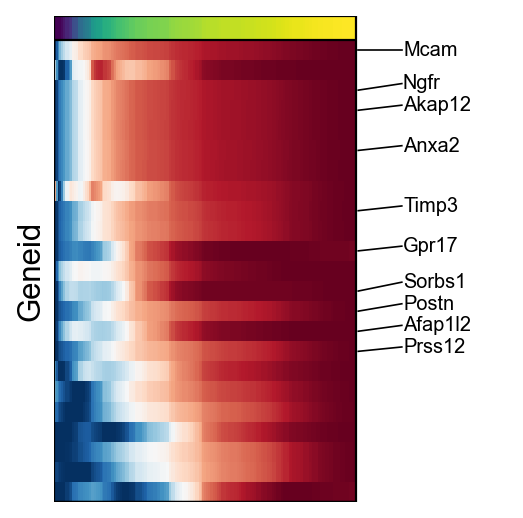

In [18]:
genes_glia=scf.pl.trends(adata_glia,cluster=1,plot_emb=False,ordering="max",return_genes=True)

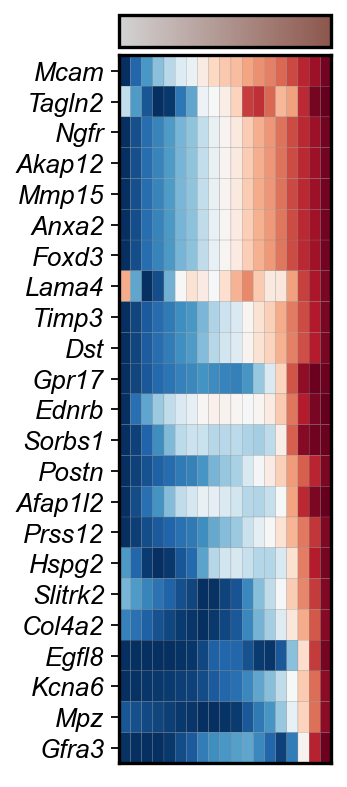

In [19]:
scf.pl.matrix(adata_glia,genes_glia,nbins=20,norm="minmax",cmap="RdBu_r",feature_style="italic",
              save="early_glia.pdf",colorbar=False)

In [20]:
from scFates.plot.utils import is_categorical, gen_milestones_gradients

In [21]:
import matplotlib.pyplot as plt
import scvelo as scv

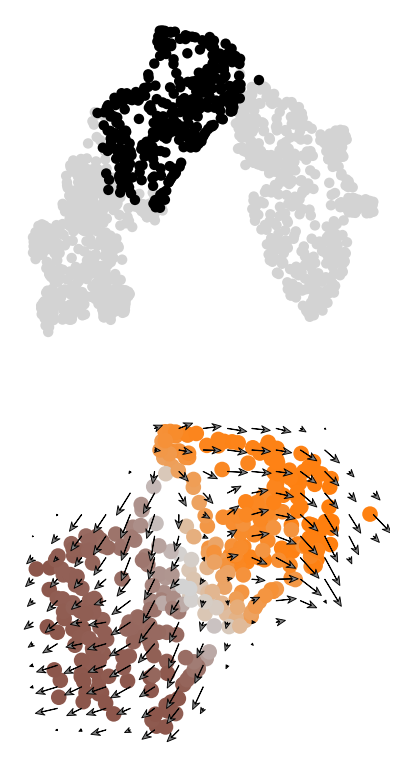

In [22]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, axs=plt.subplots(2,1,figsize=(3,6))
sc.pl.umap(adata_sub,alpha=0,show=False,frameon=False,ax=axs[1])
axs[1].scatter(adata_sub.obsm["X_umap"][:,0],
           adata_sub.obsm["X_umap"][:,1],
           c=gen_milestones_gradients(adata_sub)[adata_sub.obs_names],
           rasterized=True)

#axins = inset_axes(ax, width="30%",  height="30%", loc=2)

sc.pl.umap(adata,color="sel",groups=["True"],palette=["k"],
           frameon=False,title="",legend_loc="none",ax=axs[0],show=False)

adata_velo=sc.read("adata_CR_scFates.h5ad")
scv.pl.velocity_embedding_grid(adata_velo[adata_sub.obs_names],alpha=0,
                               recompute=False,arrow_length=3,linewidth=.4,arrow_size=4,
                               density=.3,ax=axs[1],show=False)

plt.savefig("figures/early_cells.pdf",dpi=300)

In [23]:
import scvelo as scv
scv.set_figure_params(figsize=(4,4))

In [24]:
sc.pp.neighbors(adata_sub)

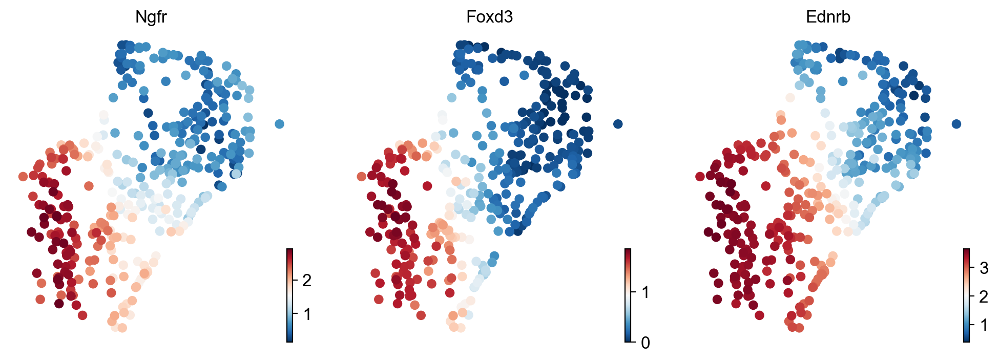

In [25]:
scv.pl.umap(adata_sub,color=["Ngfr","Foxd3","Ednrb"],cmap="RdBu_r",smooth=True)

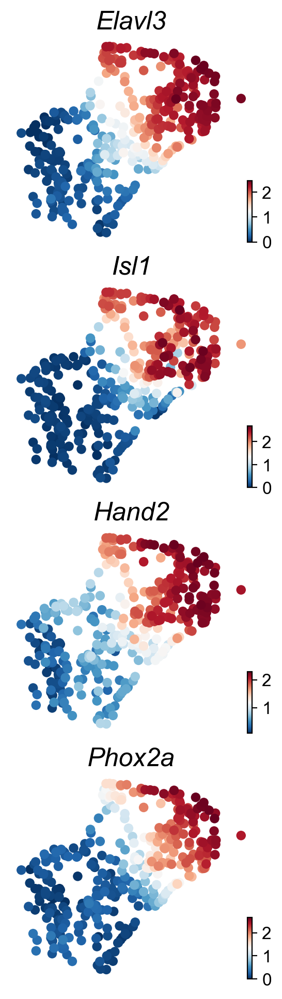

In [26]:
import matplotlib.pyplot as plt
fig, axs=plt.subplots(4,1,figsize=(3,12))
for g, ax in zip(["Elavl3","Isl1","Hand2","Phox2a"],axs):
    scv.pl.umap(adata_sub,color=g,ncols=1,cmap="RdBu_r",smooth=True,ax=ax,show=False)
    ax.set_title(ax.get_title(),style="italic",size=18)
plt.savefig("figures/chc_markers.pdf",dpi=300)

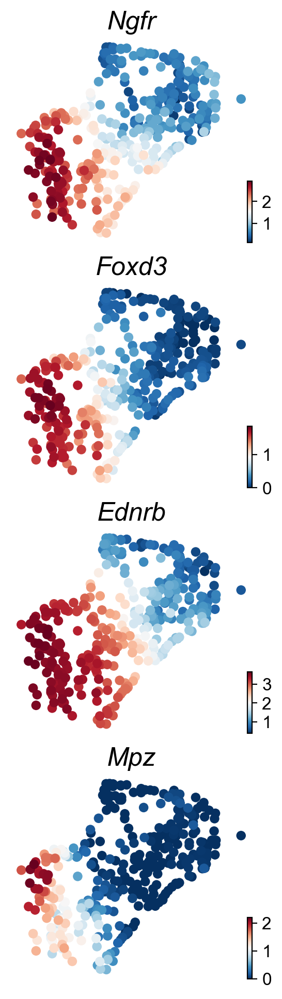

In [27]:
import matplotlib.pyplot as plt
fig, axs=plt.subplots(4,1,figsize=(3,12))
for g, ax in zip(["Ngfr","Foxd3","Ednrb","Mpz"],axs):
    scv.pl.umap(adata_sub,color=g,ncols=1,cmap="RdBu_r",smooth=True,ax=ax,show=False)
    ax.set_title(ax.get_title(),style="italic",size=18)
plt.savefig("figures/glia_markers.pdf",dpi=300)

In [28]:
fname="fig_emergence"

In [29]:
%%bash -s $fname
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=240mm,paperwidth=210mm]{geometry}
 \geometry{
 left=5mm,
 right=5mm,
 top=5mm,
 bottom=5mm,
 }

\usepackage[labelfont=bf]{caption}
\usepackage{multirow}
\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\begin{document}
\setmainfont{Arial}

\definecolor{Blue}{RGB}{50, 49, 145}

\noindent
\large 

\begin{minipage}[t]{.24\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/glia_markers.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.21\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/early_cells.pdf}
\includegraphics[width=1\textwidth]{figures/matrixearly_glia.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.28\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/matrixearly_chc.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.24\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/chc_markers.pdf}
\end{minipage}\hfill

\hfill
\clearpage


EOF

echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg
identify $1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./fig_emergence.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/multirow/multirow.sty)
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/tex

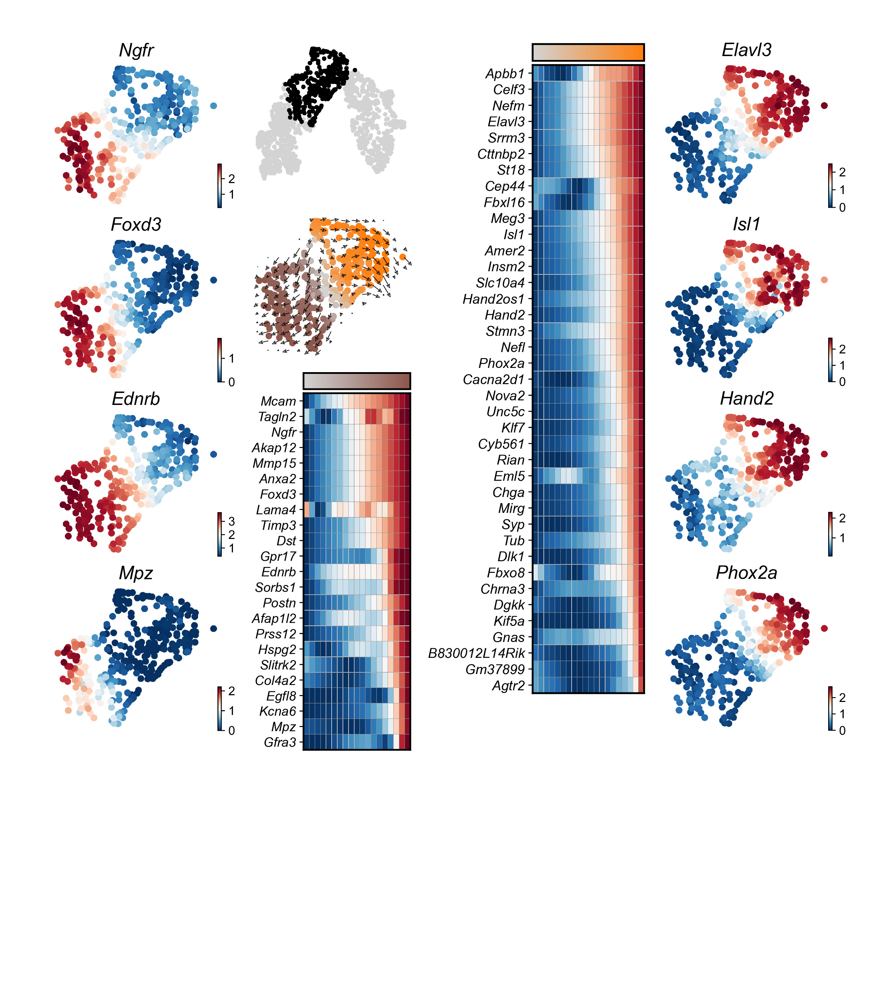

In [30]:
from IPython.display import Image
Image(filename=fname+'.jpg') 

In [31]:
sc.tl.score_genes(adata_sub,genes_glia,score_name="glia")
sc.tl.score_genes(adata_sub,genes_ChC,score_name="ChC")

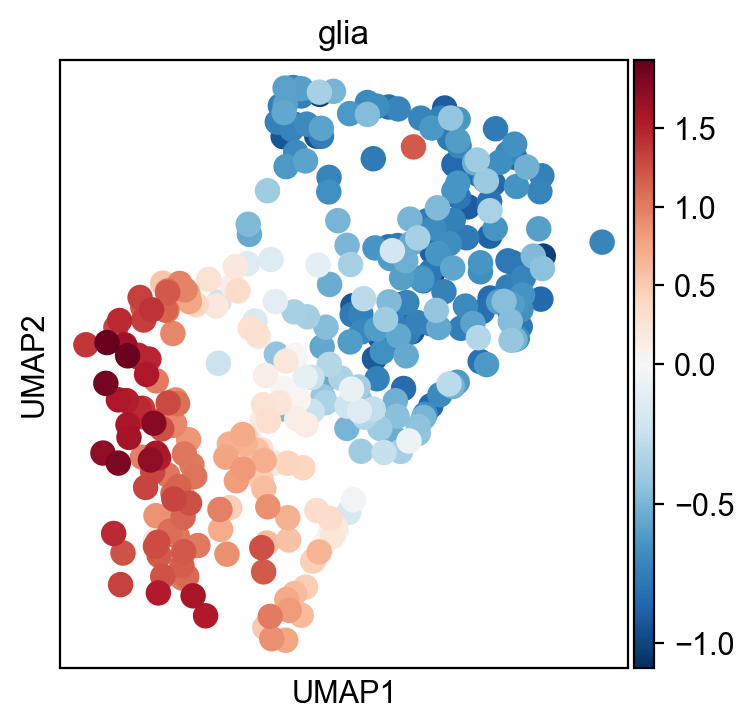

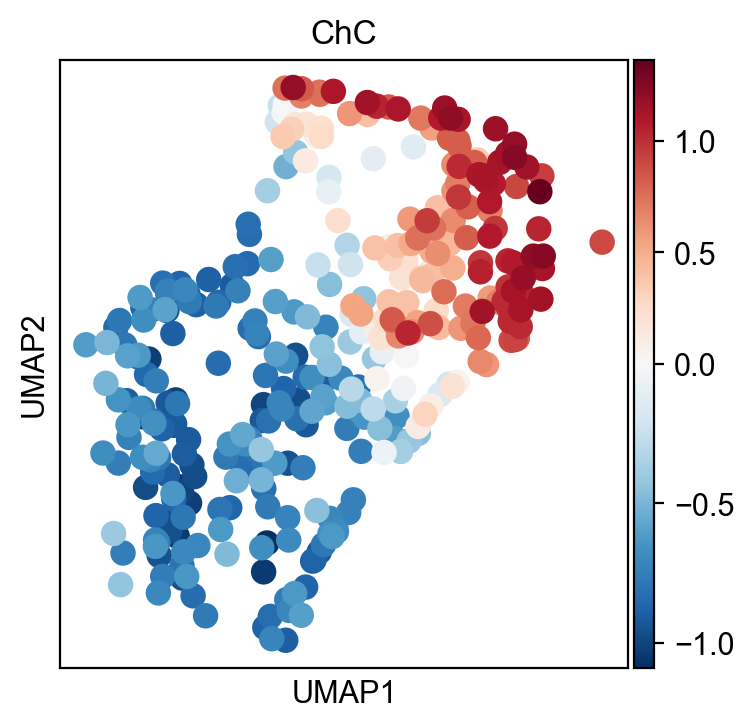

In [32]:
sc.pl.umap(adata_sub,color="glia",vcenter=0)
sc.pl.umap(adata_sub,color="ChC",vcenter=0)

In [34]:
adata_sub.obs["assign"]="SCP"
adata_sub.obs.loc[(adata_sub.obs.glia>0) & (adata_sub.obs.glia>adata_sub.obs.ChC),
              "assign"]="glia"

adata_sub.obs.loc[(adata_sub.obs.ChC>0) & (adata_sub.obs.ChC>adata_sub.obs.glia),
              "assign"]="ChC"

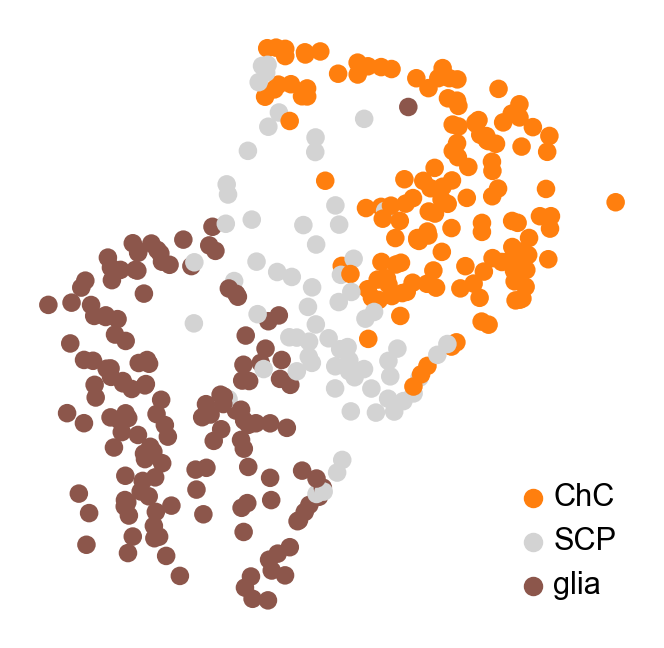

In [35]:
ax=scv.pl.umap(adata_sub,color="assign",palette=["tab:orange","lightgrey","tab:brown"],
          title="",show=False)
plt.legend(loc=4,frameon=False)
plt.savefig("figures/bias_assignment.pdf",dpi=300)

In [36]:
adata_sub.uns["SCP->early glia<>early ChC"]={"cell_freq":[(adata_sub.obs["assign"] == "SCP")*1 for i in range(4)]}

In [37]:
scf.tl.slide_cors(adata_sub,root_milestone="SCP",milestones=["early glia","early ChC"],
                 genesetA=genes_glia,genesetB=genes_ChC)

--> added 
    .uns['SCP->early glia<>early ChC']['corAB'], gene-gene correlation modules.


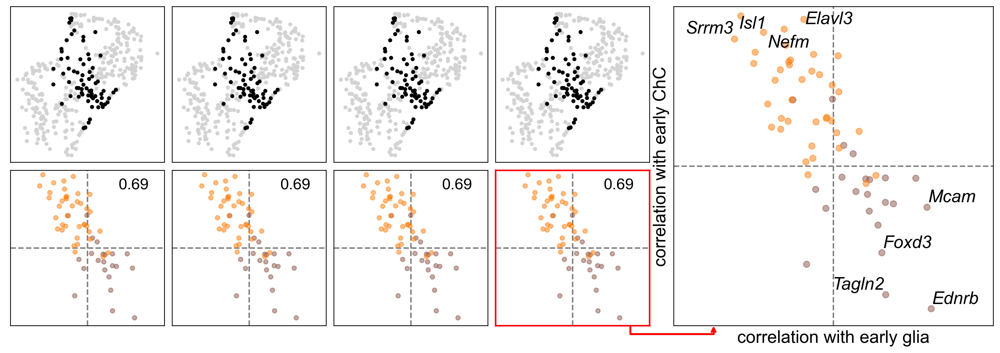

In [38]:
scf.pl.slide_cors(adata_sub,root_milestone="SCP",milestones=["early glia","early ChC"],
                 genesetA=genes_glia,genesetB=genes_ChC,focus=3,
                  kwargs_text=dict(fontsize=18,style="italic"),save="SCP_repulsion.pdf")

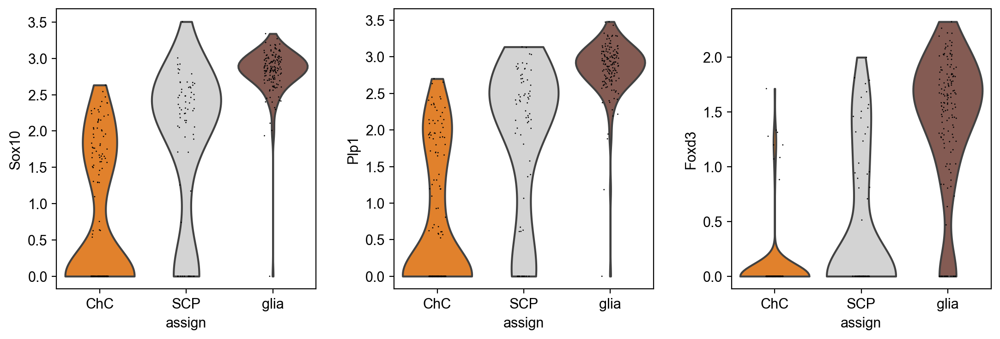

In [39]:
sc.pl.violin(adata_sub,keys=["Sox10","Plp1","Foxd3"],groupby="assign",multi_panel=True)

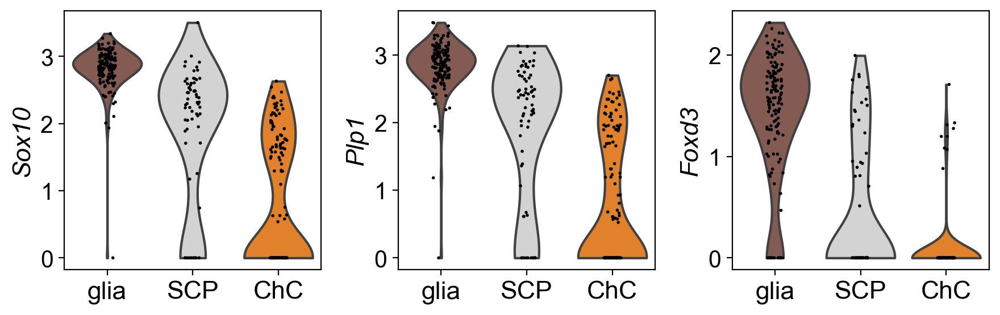

In [40]:
scv.set_figure_params(figsize=(3.5,3),fontsize=16)
axs=sc.pl.violin(adata_sub,keys=["Sox10","Plp1","Foxd3"],order=["glia","SCP","ChC"],size=2,groupby="assign",show=False)
for ax in axs:
    ax.set_ylabel(ax.get_ylabel(),style="italic",size=16)
    ax.set_xlabel("")
    ax.set_xticklabels(labels=ax.get_xticklabels(),fontdict=dict(fontsize=16))
plt.savefig("figures/SCP_markers.pdf")

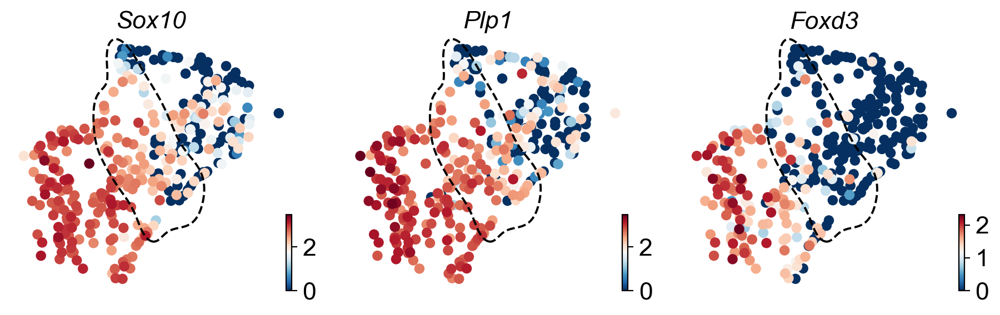

In [41]:
import seaborn as sns

fig,axs=plt.subplots(1,3,figsize=(11,3))

axs=axs.ravel()

for g,ax in zip(["Sox10","Plp1","Foxd3"],axs):
    scv.pl.umap(adata_sub,color=g,show=False,ax=ax)
    xlim=ax.get_xlim()
    ylim=ax.get_ylim()
    dat=adata_sub[adata_sub.obs["assign"]=="SCP"].obsm["X_umap"]
    sns.kdeplot(dat[:,0],dat[:,1],levels=1,ax=ax,bw=.5,thresh=.2,
                linestyles="--",linewidths=1.4,colors="k")

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_title(g,style="italic")
plt.savefig("figures/known_SCP_markers.pdf")

In [42]:
fname="biasing"

In [43]:
%%bash -s $fname
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=180mm,paperwidth=210mm]{geometry}
 \geometry{
 left=5mm,
 right=5mm,
 top=5mm,
 bottom=5mm,
 }

\usepackage[labelfont=bf]{caption}
\usepackage{multirow}
\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\begin{document}
\setmainfont{Arial}

\definecolor{Blue}{RGB}{50, 49, 145}

\noindent
\large 

\raggedright \begin{minipage}[t]{.4\textwidth}
\vspace{0cm}
\textbf{A} Cell bias assignment

\includegraphics[width=1\textwidth]{figures/bias_assignment.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.6\textwidth}
\vspace{0cm}
\raggedright \textbf{B} Repulsion of glial and ChC early modules in SCP population
\includegraphics[trim=7in 0 0 0,clip,width=1\textwidth]{figures/slide_corsSCP_repulsion.pdf}
\end{minipage}\hfill
\raggedright \textbf{C} Known markers
\includegraphics[width=1\textwidth]{figures/known_SCP_markers.pdf}

\hfill
\clearpage


EOF

echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg
identify $1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./biasing.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/multirow/multirow.sty)
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/texmf-dis

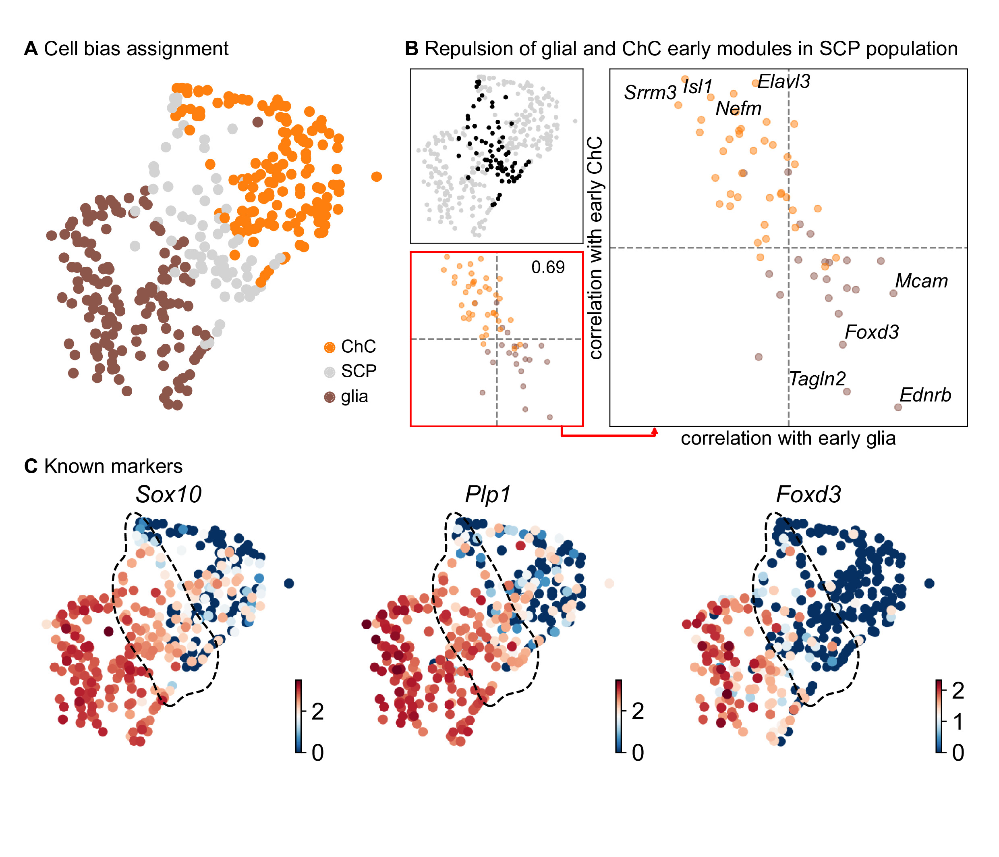

In [44]:
from IPython.display import Image
Image(filename=fname+'.jpg') 

In [45]:
adata_ChC=adata[adata.obs.leiden.isin(["3","8","11","6"])]

In [46]:
sc.tl.rank_genes_groups(adata_ChC,"leiden")

Trying to set attribute `.uns` of view, copying.


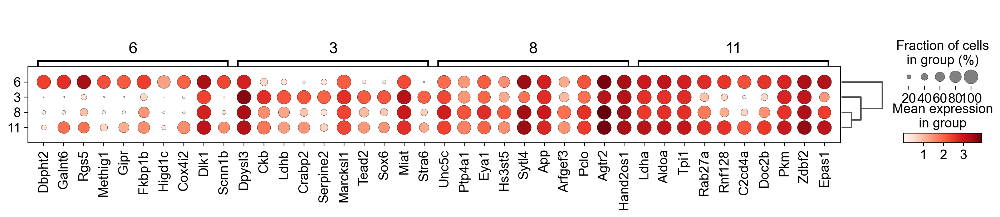

In [47]:
sc.tl.dendrogram(adata_ChC,"leiden")
sc.pl.rank_genes_groups_dotplot(adata_ChC)

In [50]:
sc.pp.neighbors(adata_ChC)

In [51]:
from scvelo.preprocessing.neighbors import get_connectivities
adata_ChC.layers["knn_smoothed"]=get_connectivities(adata_ChC, n_neighbors=None).dot(adata_ChC.X)

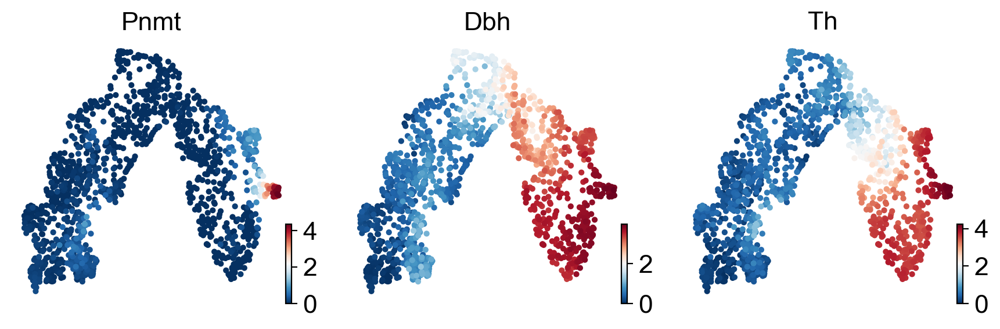

In [52]:
scv.pl.umap(adata,color=["Pnmt","Dbh","Th"],smooth=True)

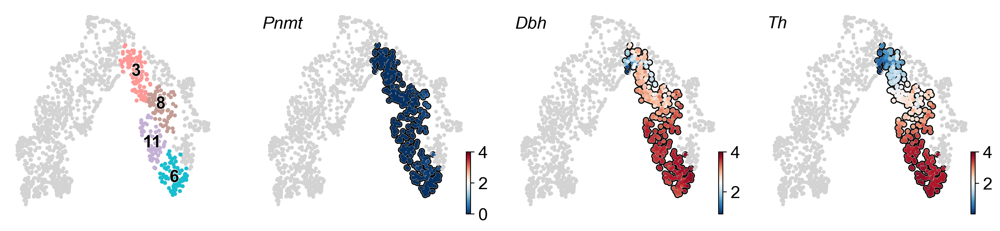

In [53]:
fig, axs=plt.subplots(1,4,figsize=(16,3.5))
axs=axs.ravel()
scv.pl.umap(adata,color="leiden",groups=["6","3","8","11"],title="",ax=axs[0],show=False)

for g,ax in zip(["Pnmt","Dbh","Th"],axs[1:]):
    scv.pl.umap(adata,color="lightgrey",show=False,s=50,ax=ax)
    scv.pl.umap(adata[adata.obs.leiden.isin(["6","3","8","11"])],show=False,
                s=50,add_outline=True,color=g,smooth=True,ax=ax,title="",vmax=4)
    ax.annotate(g,(.01,.9),xycoords="axes fraction",style="italic")
plt.savefig("figures/intermediate_init.pdf",dpi=300)

In [54]:
sc.tl.dendrogram(adata_ChC,"leiden",n_pcs=5,optimal_ordering=True,)

In [55]:
import numpy as np
def invert_dendrogram(adata,key):
    u = adata.uns[f'dendrogram_{key}']
    u['categories_idx_ordered'] = u['categories_idx_ordered'][::-1]
    u['categories_ordered'] = u['categories_ordered'][::-1]
    tmp = u['dendrogram_info']['icoord']
    u['dendrogram_info']['icoord'] = (np.max(tmp) + np.min(tmp)) - tmp

In [56]:
invert_dendrogram(adata_ChC,"leiden")

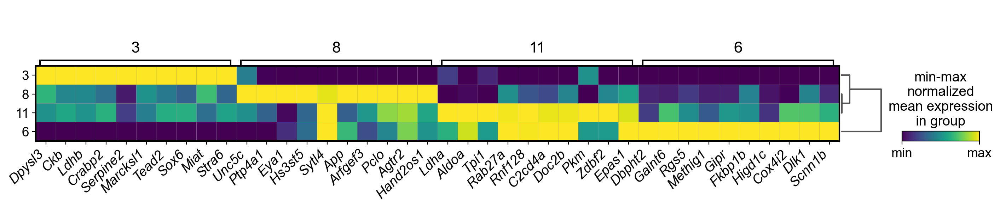

In [57]:
ax=sc.pl.rank_genes_groups_matrixplot(adata_ChC,standard_scale="var",cmap="viridis",show=False)
plt.setp(ax['mainplot_ax'].get_xticklabels(),ha="right",
         fontsize=14,style="italic", rotation=45);
ax["color_legend_ax"].set_xticklabels(["min","max"])
ax["color_legend_ax"].set_title("min-max\nnormalized\nmean expression\nin group",size=14)
plt.savefig("figures/intermediate_markers_matrix.pdf")


{'mainplot_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'Mean expression\nin group'}>}

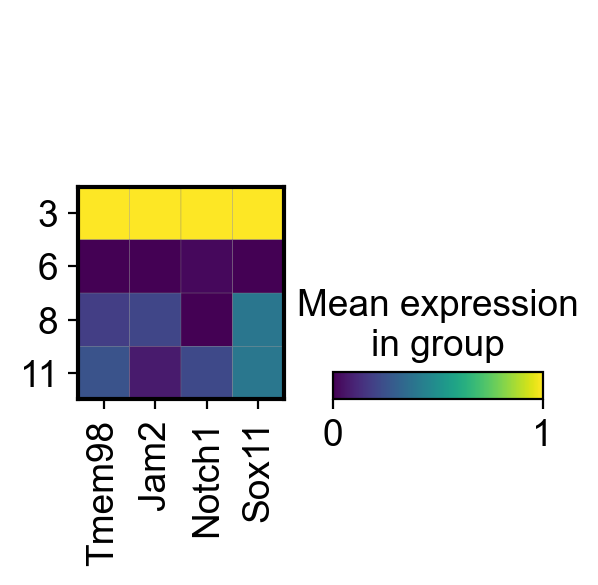

In [91]:
sc.pl.matrixplot(adata_ChC,["Tmem98","Jam2","Notch1","Sox11"],groupby="leiden",standard_scale="var",cmap="viridis",show=False)

In [59]:
import gget

In [88]:
enr_3=gget.enrichr(sc.get.rank_genes_groups_df(adata_ChC,"3",pval_cutoff=.01,log2fc_min=3).names.values,"ontology")
enr_3.loc[enr_3.adj_p_val<0.05]

Mo 23 Mai 2022 14:44:04 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Mo 23 Mai 2022 14:44:04 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021.


,rank,path_name,p_val,z_score,combined_score,overlapping_genes,adj_p_val,database
0,1,negative regulation of striated muscle cell di...,0.000053,49.765000,490.079120,"[NOTCH1, TMEM119, SOX6]",0.018265,GO_Biological_Process_2021
1,2,positive regulation of cell differentiation (G...,0.000066,7.726671,74.333559,"[FBN2, GLIPR2, TMEM119, GCNT2, SOX11, SOX6, BR...",0.018265,GO_Biological_Process_2021
2,3,regulation of myotube differentiation (GO:0010...,0.000123,36.181818,325.647748,"[MMP14, NOTCH1, TMEM119]",0.018265,GO_Biological_Process_2021
3,4,negative regulation of myelination (GO:0031642),0.000149,174.728070,1539.611380,"[TMEM98, JAM2]",0.018265,GO_Biological_Process_2021
4,5,extracellular structure organization (GO:0043062),0.000199,7.822222,66.661955,"[FBN2, MMP14, LAMA4, COL5A2, JAM2, ADAMTS7]",0.018265,GO_Biological_Process_2021
5,6,external encapsulating structure organization ...,0.000204,7.784755,66.148310,"[FBN2, MMP14, LAMA4, COL5A2, JAM2, ADAMTS7]",0.018265,GO_Biological_Process_2021
6,7,negative regulation of glial cell proliferatio...,0.000223,131.039474,1101.850345,"[NOTCH1, SOX11]",0.018265,GO_Biological_Process_2021
7,8,negative regulation of nervous system process ...,0.000311,104.826316,846.430231,"[TMEM98, JAM2]",0.018265,GO_Biological_Process_2021
8,9,negative regulation of oligodendrocyte differe...,0.000311,104.826316,846.430231,"[NOTCH1, TMEM98]",0.018265,GO_Biological_Process_2021
9,10,regulation of osteoblast differentiation (GO:0...,0.000311,13.577147,109.627646,"[FBN2, NOTCH1, TMEM119, SOX11]",0.018265,GO_Biological_Process_2021


In [95]:
enr_8=gget.enrichr(sc.get.rank_genes_groups_df(adata_ChC,"8",pval_cutoff=.01,log2fc_min=1).names.values,"ontology")
enr_8.loc[enr_8.adj_p_val<0.05]

Mo 23 Mai 2022 15:06:54 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Mo 23 Mai 2022 15:06:54 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021.


,rank,path_name,p_val,z_score,combined_score,overlapping_genes,adj_p_val,database
0,1,signal release from synapse (GO:0099643),5.668513e-09,53.775676,1021.110764,"[SNAP25, PCLO, CDK5, NRXN1, SYN2, SYN1]",0.000002,GO_Biological_Process_2021
1,2,neurotransmitter secretion (GO:0007269),6.546682e-09,52.357895,986.648270,"[SNAP25, PCLO, CDK5, NRXN1, SYN2, SYN1]",0.000002,GO_Biological_Process_2021
2,3,neurotransmitter transport (GO:0006836),4.236304e-06,23.946480,296.261527,"[SNAP25, NRXN1, SYN2, SYN1, PPFIA2]",0.000894,GO_Biological_Process_2021
3,4,anterograde trans-synaptic signaling (GO:0098916),1.557727e-05,9.860473,109.152462,"[SNAP25, CHRNA3, DLG2, CDK5, NRXN1, SYN2, SYN1]",0.002465,GO_Biological_Process_2021
4,5,chemical synaptic transmission (GO:0007268),6.590209e-05,7.791225,75.008775,"[SNAP25, CHRNA3, DLG2, CDK5, NRXN1, SYN2, SYN1]",0.008343,GO_Biological_Process_2021
5,6,membrane depolarization during SA node cell ac...,1.065662e-04,207.614583,1898.997473,"[ANK2, CACNA1D]",0.010345,GO_Biological_Process_2021
6,7,cardiac muscle cell action potential (GO:0086001),1.307449e-04,35.109347,313.956992,"[CACNA1D, DMD, ANK2]",0.010345,GO_Biological_Process_2021
7,8,synaptic vesicle cycle (GO:0099504),1.307449e-04,35.109347,313.956992,"[SNAP25, PCLO, CDK5]",0.010345,GO_Biological_Process_2021
8,9,SA node cell action potential (GO:0086015),2.228372e-04,124.556250,1047.402091,"[ANK2, CACNA1D]",0.015673,GO_Biological_Process_2021
9,10,synaptic vesicle exocytosis (GO:0016079),3.107589e-04,25.607465,206.818511,"[SNAP25, PCLO, CDK5]",0.018424,GO_Biological_Process_2021


In [111]:
enr_11=gget.enrichr(sc.get.rank_genes_groups_df(adata_ChC,"11",pval_cutoff=.01,log2fc_min=1).names.values,"ontology")
enr_11.loc[enr_11.adj_p_val<0.05]

Mo 23 Mai 2022 15:12:12 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Mo 23 Mai 2022 15:12:12 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021.


,rank,path_name,p_val,z_score,combined_score,overlapping_genes,adj_p_val,database
0,1,pyruvate metabolic process (GO:0006090),0.000004,12.500453,156.159490,"[LDHA, PFKL, TPI1, ME2, ALDOA, SLC16A3, HK2]",0.002878,GO_Biological_Process_2021
1,2,canonical glycolysis (GO:0061621),0.000008,22.395644,263.059720,"[PFKL, TPI1, ALDOA, HK2, PFKP]",0.002878,GO_Biological_Process_2021
2,3,glucose catabolic process to pyruvate (GO:0061...,0.000008,22.395644,263.059720,"[PFKL, TPI1, ALDOA, HK2, PFKP]",0.002878,GO_Biological_Process_2021
3,4,carbohydrate catabolic process (GO:0016052),0.000008,14.640445,171.354802,"[LDHA, PFKL, TPI1, ALDOA, HK2, DERA]",0.002878,GO_Biological_Process_2021
4,5,catecholamine biosynthetic process (GO:0042423),0.000009,42.392704,493.332013,"[GCH1, TH, DBH, INSM1]",0.002878,GO_Biological_Process_2021
5,6,glycolytic process through glucose-6-phosphate...,0.000010,21.274784,245.352452,"[PFKL, TPI1, ALDOA, HK2, PFKP]",0.002878,GO_Biological_Process_2021
6,7,cellular response to decreased oxygen levels (...,0.000017,9.670898,106.013416,"[FAM162A, EPAS1, BNIP3, AK4, NDRG1, VEGFA, CPEB4]",0.004364,GO_Biological_Process_2021
7,8,glycolytic process (GO:0006096),0.000021,17.725395,190.847187,"[LDHA, PFKL, TPI1, ALDOA, HK2]",0.004642,GO_Biological_Process_2021
8,9,norepinephrine biosynthetic process (GO:0042421),0.000032,84.444444,873.964966,"[TH, DBH, INSM1]",0.006263,GO_Biological_Process_2021
9,10,norepinephrine metabolic process (GO:0042415),0.000056,63.330128,620.557016,"[TH, DBH, INSM1]",0.009777,GO_Biological_Process_2021


In [87]:
enr_6=gget.enrichr(sc.get.rank_genes_groups_df(adata_ChC,"6",pval_cutoff=.01,log2fc_min=3).names.values,"ontology")
enr_6.loc[enr_6.adj_p_val<0.05]

Mo 23 Mai 2022 14:42:34 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Mo 23 Mai 2022 14:42:34 CEST INFO Performing Enichr analysis using database GO_Biological_Process_2021.


,rank,path_name,p_val,z_score,combined_score,overlapping_genes,adj_p_val,database
0,1,chemical synaptic transmission (GO:0007268),1.231092e-07,5.304466,84.395086,"[GRIA2, SYT1, NRXN1, KCNC4, RIT2, TH, NPY, PMP...",0.000194,GO_Biological_Process_2021
1,2,anterograde trans-synaptic signaling (GO:0098916),6.126129e-06,4.997403,59.983561,"[GRIA2, SYT1, NRXN1, KCNC4, RIT2, NPY, PMP22, ...",0.004830,GO_Biological_Process_2021
2,3,adenylate cyclase-modulating G protein-coupled...,2.453609e-05,5.673948,60.231028,"[MC4R, P2RY12, GNAL, ADORA2A, ADGRB3, GIPR, CN...",0.012898,GO_Biological_Process_2021
3,4,negative regulation of neuron projection devel...,5.719726e-05,10.021179,97.896946,"[EPHA4, LINGO1, DCC, STMN2, SPOCK1, THY1]",0.022550,GO_Biological_Process_2021
4,5,adenylate cyclase-activating G protein-coupled...,7.323380e-05,6.353778,60.499741,"[MC4R, GNAL, ADORA2A, ADGRB3, CNR1, ADM, DRD2,...",0.023098,GO_Biological_Process_2021
5,6,axon guidance (GO:0007411),1.400370e-04,4.547968,40.356868,"[EPHA4, DAB1, UNC5A, DCC, NRXN1, PTPRM, VLDLR,...",0.036806,GO_Biological_Process_2021
6,7,lipid phosphorylation (GO:0046834),1.763198e-04,36.819876,318.241952,"[DGKG, DGKB, DGKH]",0.039722,GO_Biological_Process_2021


In [117]:
adata_ChC.obs.leiden=adata_ChC.obs.leiden.cat.reorder_categories(['3', '8', '11','6'])

In [152]:
ax["gene_group_ax"].set_

<AxesSubplot:>

categories: 3, 8, 11, etc.
var_group_labels: downreg.
glial fate, early ChC
progen. 1, early ChC
progen. 2, etc.


Mo 23 Mai 2022 15:43:36 CEST INFO maxp pruned
Mo 23 Mai 2022 15:43:36 CEST INFO LTSH dropped
Mo 23 Mai 2022 15:43:36 CEST INFO cmap pruned
Mo 23 Mai 2022 15:43:36 CEST INFO kern pruned
Mo 23 Mai 2022 15:43:36 CEST INFO post pruned
Mo 23 Mai 2022 15:43:36 CEST INFO PCLT dropped
Mo 23 Mai 2022 15:43:36 CEST INFO GSUB pruned
Mo 23 Mai 2022 15:43:36 CEST INFO JSTF dropped
Mo 23 Mai 2022 15:43:36 CEST INFO DSIG dropped
Mo 23 Mai 2022 15:43:36 CEST INFO name pruned
Mo 23 Mai 2022 15:43:36 CEST INFO glyf pruned
Mo 23 Mai 2022 15:43:36 CEST INFO Added gid0 to subset
Mo 23 Mai 2022 15:43:36 CEST INFO Added first four glyphs to subset
Mo 23 Mai 2022 15:43:36 CEST INFO Closing glyph list over 'GSUB': 32 glyphs before
Mo 23 Mai 2022 15:43:36 CEST INFO Glyph names: ['.notdef', '.null', 'C', 'a', 'd', 'e', 'eight', 'f', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'x', 'y', 'z']
Mo 23 Mai 2022 15:43:36

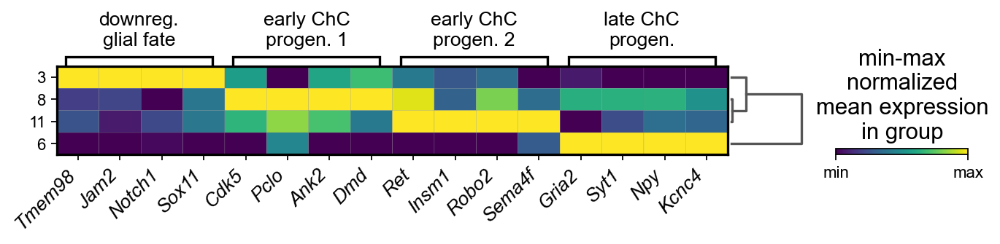

In [167]:
sc.set_figure_params(fontsize=12)
ax=sc.pl.matrixplot(adata_ChC,{"downreg.\nglial fate":["Tmem98","Jam2","Notch1","Sox11"],
                            "early ChC\nprogen. 1":["Cdk5","Pclo","Ank2","Dmd"],
                            "early ChC\nprogen. 2":["Ret","Insm1","Robo2","Sema4f"],
                            "late ChC\nprogen.":["Gria2","Syt1","Npy","Kcnc4"]},figsize=(10,1),
                 groupby="leiden",standard_scale="var",cmap="viridis",show=False,dendrogram=True,var_group_rotation=0)
plt.setp(ax['mainplot_ax'].get_xticklabels(),ha="right",
         fontsize=12,style="italic", rotation=45);
ax["color_legend_ax"].set_xticks([0,1])
ax["color_legend_ax"].set_xticklabels(["min","max"])
ax["color_legend_ax"].set_title("min-max\nnormalized\nmean expression\nin group",size=14)

plt.savefig("figures/intermediate_markers_matrix.pdf")

Mo 23 Mai 2022 15:40:35 CEST INFO maxp pruned
Mo 23 Mai 2022 15:40:35 CEST INFO LTSH dropped
Mo 23 Mai 2022 15:40:35 CEST INFO cmap pruned
Mo 23 Mai 2022 15:40:35 CEST INFO kern pruned
Mo 23 Mai 2022 15:40:35 CEST INFO post pruned
Mo 23 Mai 2022 15:40:35 CEST INFO PCLT dropped
Mo 23 Mai 2022 15:40:35 CEST INFO GSUB pruned
Mo 23 Mai 2022 15:40:35 CEST INFO JSTF dropped
Mo 23 Mai 2022 15:40:35 CEST INFO DSIG dropped
Mo 23 Mai 2022 15:40:35 CEST INFO name pruned
Mo 23 Mai 2022 15:40:35 CEST INFO glyf pruned
Mo 23 Mai 2022 15:40:35 CEST INFO Added gid0 to subset
Mo 23 Mai 2022 15:40:35 CEST INFO Added first four glyphs to subset
Mo 23 Mai 2022 15:40:35 CEST INFO Closing glyph list over 'GSUB': 13 glyphs before
Mo 23 Mai 2022 15:40:35 CEST INFO Glyph names: ['.notdef', '.null', 'eight', 'five', 'four', 'nonmarkingreturn', 'one', 'period', 'six', 'space', 'three', 'two', 'zero']
Mo 23 Mai 2022 15:40:35 CEST INFO Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 27]
Mo 23 Mai 2022 15:

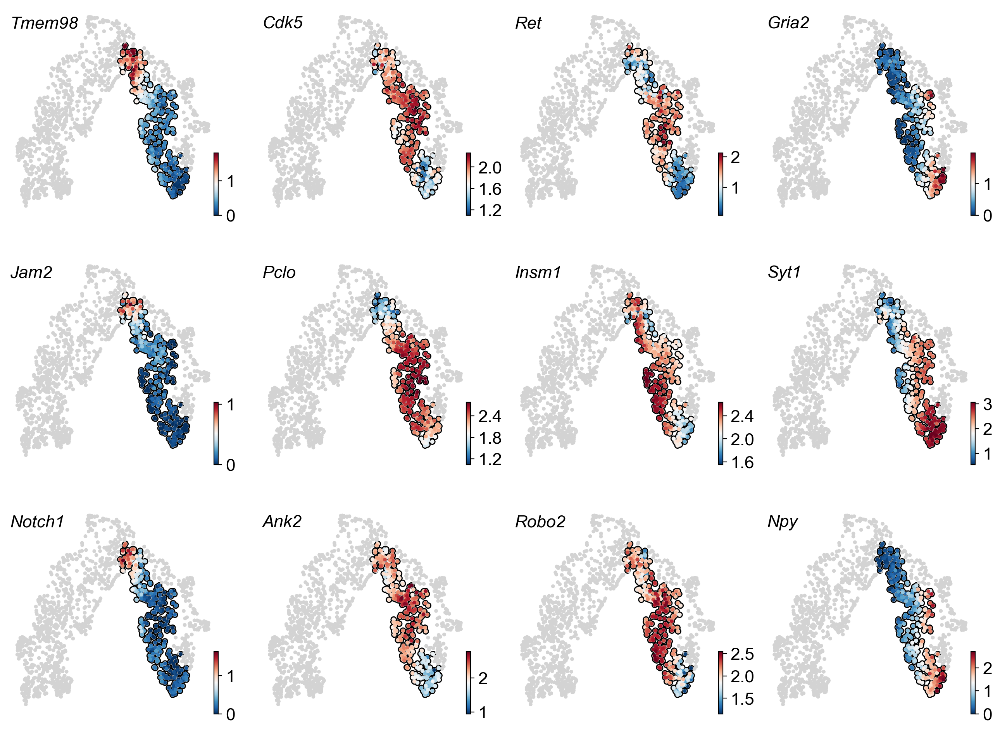

In [159]:
scv.set_figure_params(figsize=(3.5,3),fontsize=16)
genes=["Tmem98","Jam2","Notch1",
       "Cdk5","Pclo","Ank2",
       "Ret","Insm1","Robo2",
       "Gria2","Syt1","Npy",]
genes=np.array(genes).reshape((4,3)).T.ravel()

fig, axs=plt.subplots(3,4,figsize=(16,12))

axs=axs.ravel()

for ax,g in zip(axs,genes):
    scv.pl.umap(adata,color="lightgrey",show=False,s=50,ax=ax)
    scv.pl.umap(adata[adata.obs.leiden.isin(["6","3","8","11"])],show=False,
                s=50,add_outline=True,color=g,smooth=True,ax=ax,title="")
    ax.annotate(g,(.01,.9),xycoords="axes fraction",style="italic")
    
plt.savefig("figures/intermediate_markers_umaps.pdf",dpi=300)

In [169]:
fname="Fig8_intermediate_hetero"

In [173]:
%%bash -s $fname
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=275mm,paperwidth=210mm]{geometry}
 \geometry{
 left=5mm,
 right=5mm,
 top=5mm,
 bottom=5mm,
 }

\usepackage[labelfont=bf]{caption}
\usepackage{multirow}
\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\begin{document}
\setmainfont{Arial}

\definecolor{Blue}{RGB}{50, 49, 145}

\noindent
\large 

\raggedright \textbf{A} ChC intermediate states
\includegraphics[width=1\textwidth]{figures/intermediate_init.pdf}
\raggedright \textbf{B} Heterogeneity of ChC intermediate states
\includegraphics[width=1\textwidth]{figures/intermediate_markers_matrix.pdf}
\raggedright \textbf{C} Markers defining intermediate clusters
\includegraphics[width=1\textwidth]{figures/intermediate_markers_umaps.pdf}

\hfill
\clearpage


EOF

echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg
identify $1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./Fig8_intermediate_hetero.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/multirow/multirow.sty)
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/

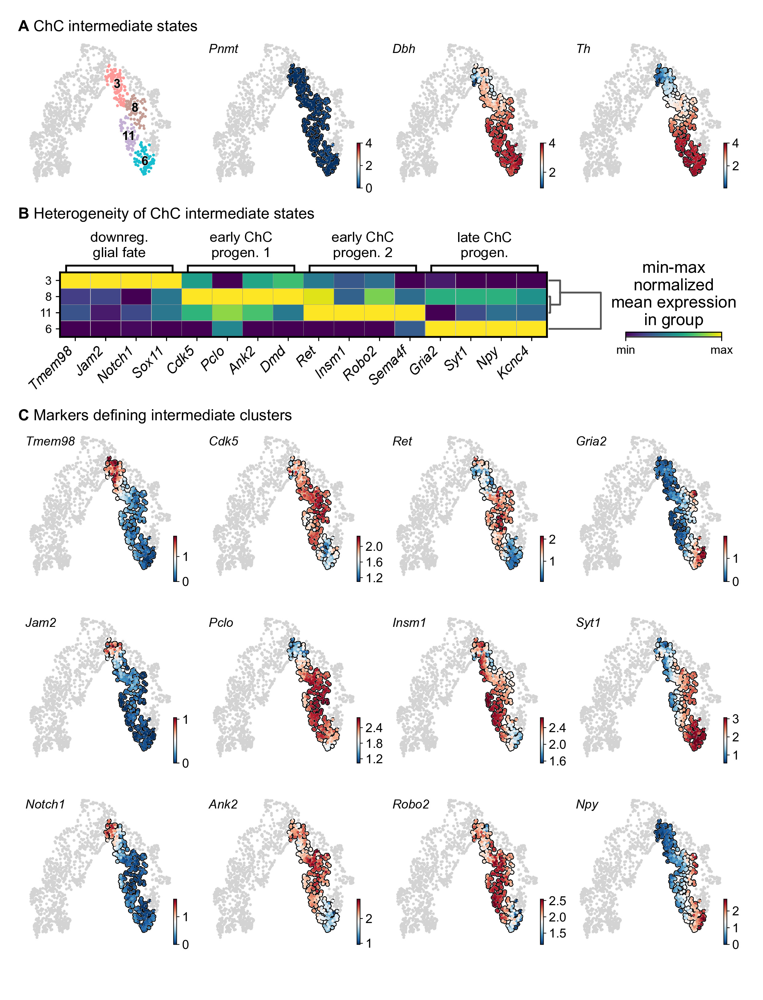

In [174]:
from IPython.display import Image
Image(filename=fname+'.jpg') 